# Analysis and visualization of spatial transcriptomics data

**Author:** Giovanni Palla

.. note::

   For up-to-date analysis tutorials, kindly check out [SquidPy tutorials](https://squidpy.readthedocs.io/en/stable/tutorials.html#>).

* This tutorial demonstrates how to work with spatial transcriptomics data within Scanpy.
* We focus on 10x Genomics [Visium](https://www.10xgenomics.com/spatial-transcriptomics/) data, and provide an example for MERFISH.

In [12]:
# Install scanpy if not already installed
!pip install scanpy

from __future__ import annotations

import matplotlib.pyplot as plt
import pandas as pd
import scanpy as sc
import seaborn as sns

In [13]:
sc.logging.print_versions()
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3

/tmp/ipykernel_5819/679762080.py:1: FutureWarning: Use `print_header` instead
  sc.logging.print_versions()


## Reading the data

We will use a Visium spatial transcriptomics dataset of the human lymphnode, which is publicly available from the 10x genomics website: [link](https://support.10xgenomics.com/spatial-gene-expression/datasets/1.0.0/V1_Human_Lymph_Node).

The function {func}`scanpy.datasets.visium_sge` downloads the dataset from 10x Genomics and returns an `AnnData` object that contains counts, images and spatial coordinates.
We will calculate standards QC metrics with {func}`scanpy.pp.calculate_qc_metrics` and percentage of mitochondrial read counts per sample.

When using your own Visium data, use {func}`squidpy.read.visium` function to import it.

In [14]:
adata = sc.datasets.visium_sge(sample_id="V1_Human_Lymph_Node")
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

reading data/V1_Human_Lymph_Node/filtered_feature_bc_matrix.h5


/tmp/ipykernel_5819/1997158664.py:1: FutureWarning: Use `squidpy.datasets.visium` instead.
  adata = sc.datasets.visium_sge(sample_id="V1_Human_Lymph_Node")


 (0:00:04)


/usr/local/lib/python3.12/dist-packages/anndata/_core/anndata.py:1880: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


This is how the adata structure looks like for Visium data

In [15]:
adata

AnnData object with n_obs × n_vars = 4035 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'spatial'

## QC and preprocessing

We perform some basic filtering of spots based on total counts and expressed genes

<Axes: xlabel='n_genes_by_counts', ylabel='Count'>

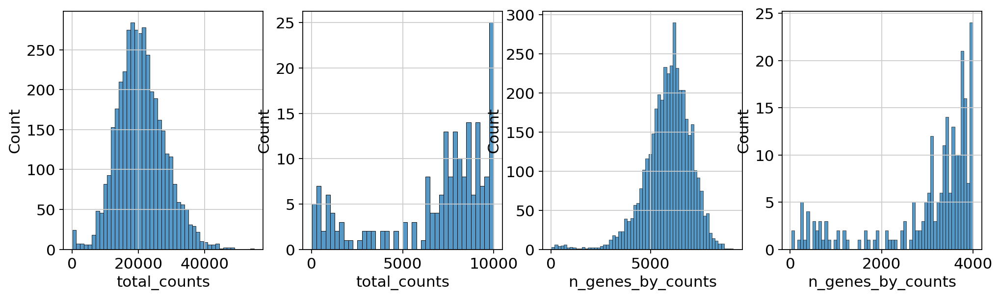

In [16]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.histplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.histplot(
    adata.obs["total_counts"][adata.obs["total_counts"] < 10000],
    kde=False,
    bins=40,
    ax=axs[1],
)
sns.histplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.histplot(
    adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 4000],
    kde=False,
    bins=60,
    ax=axs[3],
)

In [17]:
sc.pp.filter_cells(adata, min_counts=5000)
sc.pp.filter_cells(adata, max_counts=35000)
adata = adata[adata.obs["pct_counts_mt"] < 20].copy()
print(f"#cells after MT filter: {adata.n_obs}")
sc.pp.filter_genes(adata, min_cells=10)

filtered out 44 cells that have less than 5000 counts
filtered out 130 cells that have more than 35000 counts
#cells after MT filter: 3861
filtered out 16916 genes that are detected in less than 10 cells


We proceed to normalize Visium counts data with the built-in `normalize_total` method from Scanpy, and detect highly-variable genes (for later). Note that there are alternatives for normalization (see discussion in [[Luecken19](https://www.embopress.org/doi/full/10.15252/msb.20188746)], and more recent alternatives such as [SCTransform](https://genomebiology.biomedcentral.com/articles/10.1186/s13059-019-1874-1) or [GLM-PCA](https://genomebiology.biomedcentral.com/articles/10.1186/s13059-019-1861-6)).

In [18]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


## Manifold embedding and clustering based on transcriptional similarity

To embed and cluster the manifold encoded by transcriptional similarity, we proceed as in the standard clustering tutorial.

In [19]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
!pip install python-igraph
sc.tl.leiden(adata, key_added="clusters", flavor="igraph", directed=False, n_iterations=2)

computing PCA
    with n_comps=50
    finished (0:00:03)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:08)
running Leiden clustering
    finished: found 10 clusters and added
    'clusters', the cluster labels (adata.obs, categorical) (0:00:00)


We plot some covariates to check if there is any particular structure in the UMAP associated with total counts and detected genes.

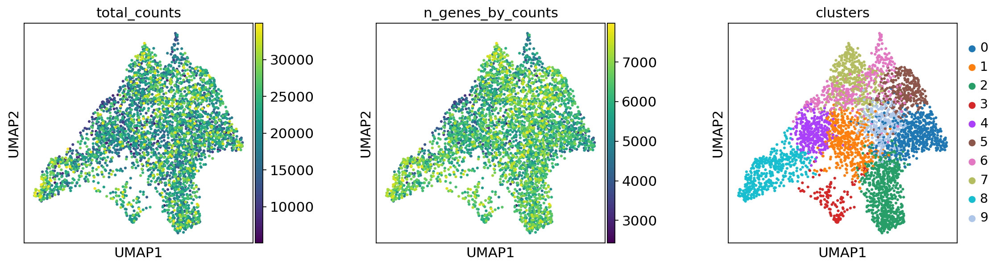

In [20]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "clusters"], wspace=0.4)

## Visualization in spatial coordinates

Let us now take a look at how `total_counts` and `n_genes_by_counts` behave in spatial coordinates.
We will overlay the circular spots on top of the Hematoxylin and eosin stain (H&E) image provided, using the function {func}`scanpy.pl.spatial`.

/tmp/ipykernel_5819/2709366047.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, img_key="hires", color=["total_counts", "n_genes_by_counts"])


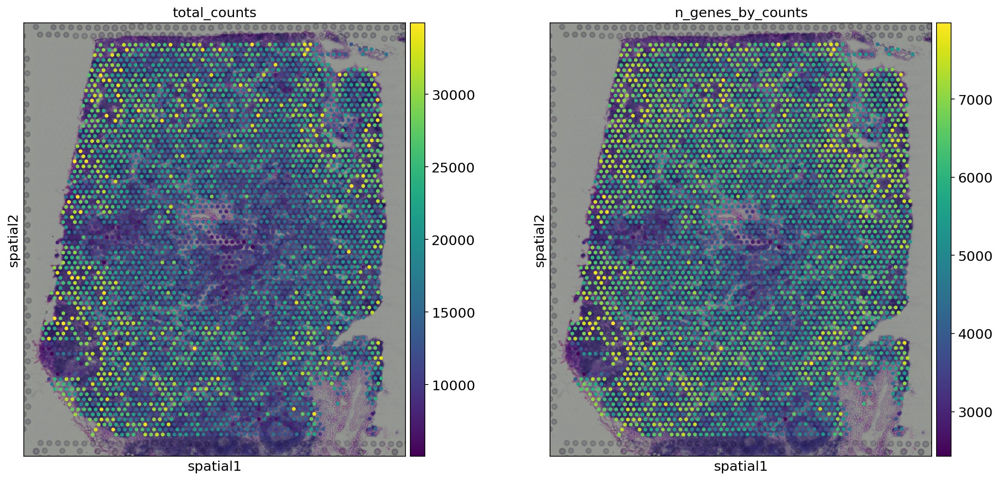

In [21]:
plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.spatial(adata, img_key="hires", color=["total_counts", "n_genes_by_counts"])

The function {func}`scanpy.pl.spatial` accepts 4 additional parameters:

* `img_key`: key where the img is stored in the `adata.uns` element
* `crop_coord`: coordinates to use for cropping (left, right, top, bottom)
* `alpha_img`: alpha value for the transcparency of the image
* `bw`: flag to convert the image into gray scale  

Furthermore, in {func}`scanpy.pl.spatial`, the `size` parameter changes its behaviour: it becomes a scaling factor for the spot sizes.

Before, we performed clustering in gene expression space, and visualized the results with UMAP. By visualizing clustered samples in spatial dimensions, we can gain insights into tissue organization and, potentially, into inter-cellular communication.

/tmp/ipykernel_5819/1586445018.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, img_key="hires", color="clusters", size=1.5)


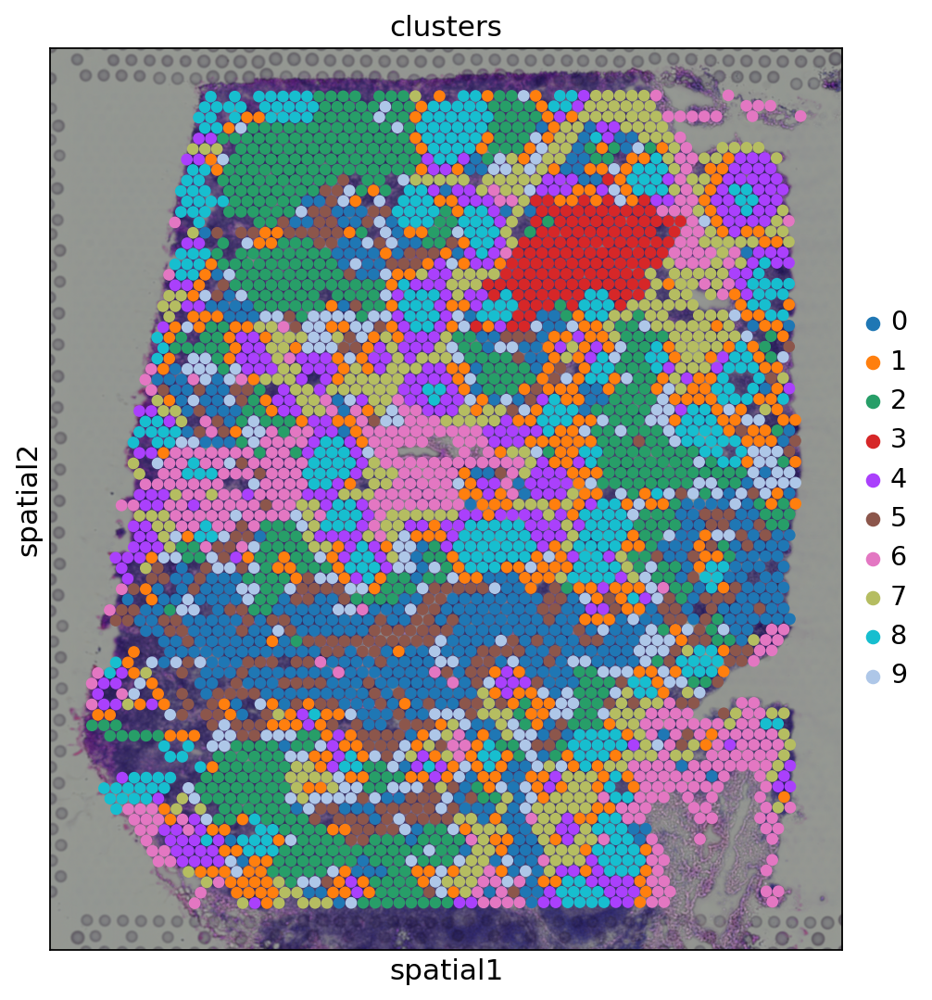

In [22]:
sc.pl.spatial(adata, img_key="hires", color="clusters", size=1.5)

Spots belonging to the same cluster in gene expression space often co-occur in spatial dimensions. For instance, spots belonging to cluster 5 are often surrounded by spots belonging to cluster 0.

We can zoom in specific regions of interests to gain qualitative insights. Furthermore, by changing the alpha values of the spots, we can visualize better the underlying tissue morphology from the H&E image.

/tmp/ipykernel_5819/1211804544.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


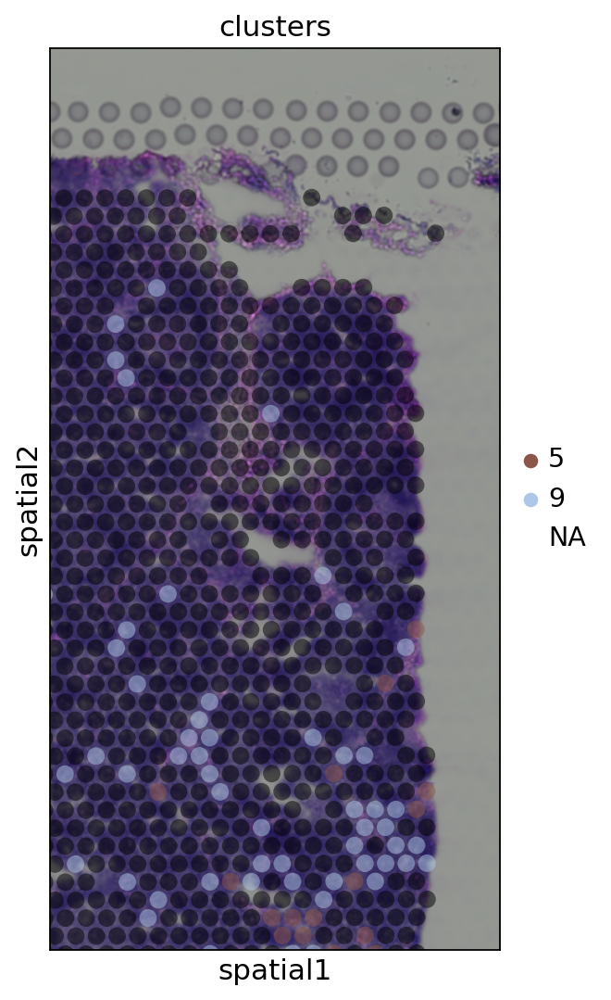

In [23]:
sc.pl.spatial(
    adata,
    img_key="hires",
    color="clusters",
    groups=["5", "9"],
    crop_coord=[7000, 10000, 0, 6000],
    alpha=0.5,
    size=1.3,
)

## Cluster marker genes

Let us further inspect cluster 5, which occurs in small groups of spots across the image.

Compute marker genes and plot a heatmap with expression levels of its top 10 marker genes across clusters.

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:08)
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_clusters']`
categories: 0, 1, 2, etc.
var_group_labels: 9


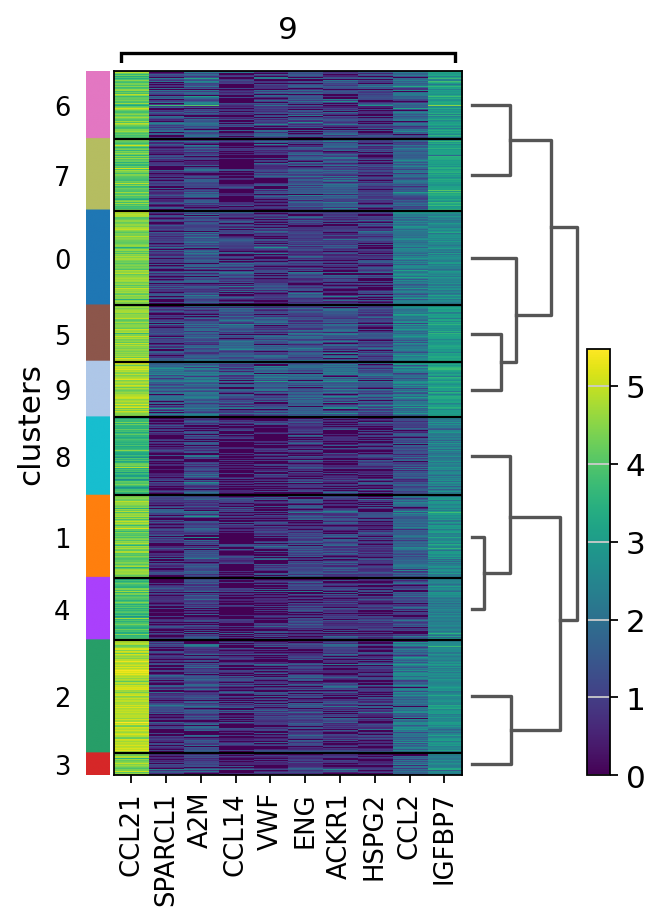

In [24]:
sc.tl.rank_genes_groups(adata, "clusters", method="t-test")
sc.pl.rank_genes_groups_heatmap(adata, groups="9", n_genes=10, groupby="clusters")

We see that *CR2* recapitulates the spatial structure.

/tmp/ipykernel_5819/399102798.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, img_key="hires", color=["clusters", "CR2"])


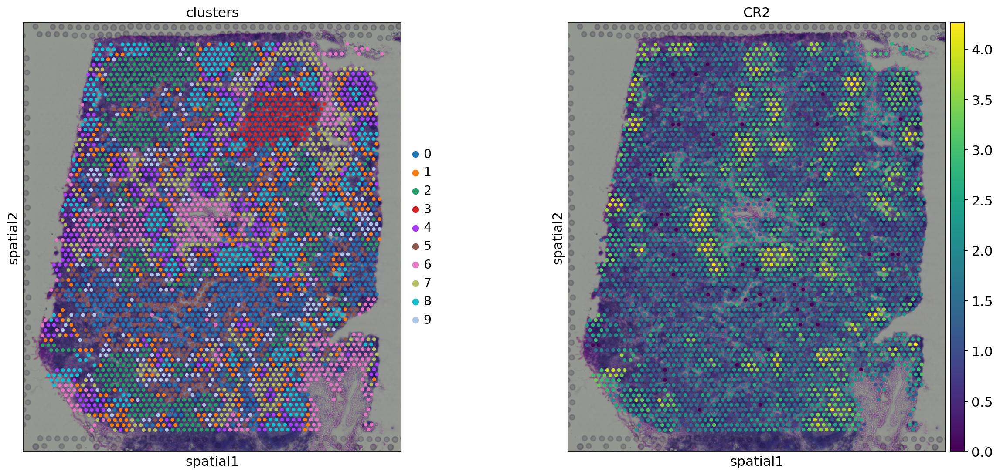

In [25]:
sc.pl.spatial(adata, img_key="hires", color=["clusters", "CR2"])

/tmp/ipykernel_5819/989218410.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, img_key="hires", color=["COL1A2", "SYPL1"], alpha=0.7)


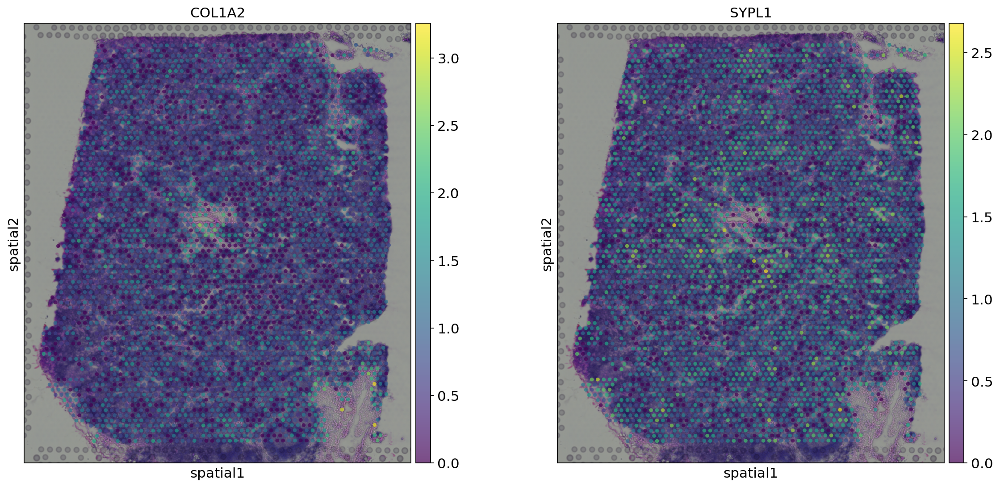

In [26]:
sc.pl.spatial(adata, img_key="hires", color=["COL1A2", "SYPL1"], alpha=0.7)

## MERFISH example

In case you have spatial data generated with FISH-based techniques, just read the cordinate table and assign it to the `adata.obsm` element.

Let's take a look at the example from [Xia et al. 2019](https://www.pnas.org/content/116/39/19490.abstract).

First, we need to download the coordinate and counts data from the original publication: [coordinates](https://www.pnas.org/doi/suppl/10.1073/pnas.1912459116/suppl_file/pnas.1912459116.sd15.xlsx) to ./data/pnas.1912459116.sd15.csv and [counts](https://www.pnas.org/doi/suppl/10.1073/pnas.1912459116/suppl_file/pnas.1912459116.sd12.csv) to ./data/pnas.1912459116.sd12.csv

In [33]:
# If needed:
%pip install openpyxl

In [37]:
import os
import pandas as pd
import scanpy as sc
import zipfile

os.makedirs('./data', exist_ok=True)

coordinates_path = './data/pnas.1912459116.sd15.xlsx'
counts_path      = './data/pnas.1912459116.sd12.csv'

# ── Validate files before reading ──────────────────────────────────────────

def is_valid_excel(path):
    """Returns True only if the file is a real xlsx (zip-based) file."""
    try:
        with zipfile.ZipFile(path):
            return True
    except (zipfile.BadZipFile, FileNotFoundError):
        return False

def is_valid_csv(path):
    try:
        with open(path, 'r') as f:
            first = f.read(10)
        return len(first) > 0 and first.strip()[0] != '<'   # not HTML
    except FileNotFoundError:
        return False

# ── Helpful error messages ──────────────────────────────────────────────────

if not os.path.exists(coordinates_path):
    raise FileNotFoundError(
        f"\n[Missing file] {coordinates_path}\n"
        "Please download it manually from:\n"
        "  https://www.pnas.org/doi/suppl/10.1073/pnas.1912459116/suppl_file/pnas.1912459116.sd15.xlsx\n"
        "and place it in the ./data/ folder."
    )

if not is_valid_excel(coordinates_path):
    raise ValueError(
        f"\n[Corrupt file] {coordinates_path} is not a valid Excel file.\n"
        "It was likely saved as an HTML error page (403/redirect).\n"
        "Please re-download it from PNAS and re-upload the actual .xlsx file."
    )

if not os.path.exists(counts_path):
    raise FileNotFoundError(
        f"\n[Missing file] {counts_path}\n"
        "Please download it manually from:\n"
        "  https://www.pnas.org/doi/suppl/10.1073/pnas.1912459116/suppl_file/pnas.1912459116.sd12.csv\n"
        "and place it in the ./data/ folder."
    )

if not is_valid_csv(counts_path):
    raise ValueError(
        f"\n[Corrupt file] {counts_path} appears to be an HTML page, not a CSV.\n"
        "Please re-download and re-upload the actual .csv file."
    )

# ── Load data ───────────────────────────────────────────────────────────────

coordinates = pd.read_excel(coordinates_path, index_col=0, engine='openpyxl')
counts = sc.read_csv(counts_path).T   # .T is equivalent to .transpose()

print("Coordinates shape:", coordinates.shape)
print("Counts shape:     ", counts.shape)
print("Done ✓")

ValueError: 
[Corrupt file] ./data/pnas.1912459116.sd15.xlsx is not a valid Excel file.
It was likely saved as an HTML error page (403/redirect).
Please re-download it from PNAS and re-upload the actual .xlsx file.

In [41]:
adata_merfish = counts[coordinates.index, :].copy()
adata_merfish.obsm["spatial"] = coordinates.to_numpy()

NameError: name 'counts' is not defined

We will perform standard preprocessing and dimensionality reduction.

In [40]:
sc.pp.normalize_per_cell(adata_merfish, counts_per_cell_after=1e6)
sc.pp.log1p(adata_merfish)
sc.pp.pca(adata_merfish, n_comps=15)
sc.pp.neighbors(adata_merfish)
sc.tl.umap(adata_merfish)
sc.tl.leiden(
    adata_merfish,
    key_added="clusters",
    resolution=0.5,
    n_iterations=2,
    flavor="igraph",
    directed=False,
)

NameError: name 'adata_merfish' is not defined

The experiment consisted in measuring gene expression counts from a single cell type (cultured U2-OS cells). Clusters consist of cell states at different stages of the cell cycle. We don't expect to see specific structure in spatial dimensions given the experimental setup.

We can visualize the clusters obtained from running Leiden in UMAP space and spatial coordinates like this.

In [39]:
adata_merfish

NameError: name 'adata_merfish' is not defined

In [38]:
sc.pl.umap(adata_merfish, color="clusters")
sc.pl.embedding(adata_merfish, basis="spatial", color="clusters")

NameError: name 'adata_merfish' is not defined

We hope you found the tutorial useful!

[Report back to us](https://github.com/theislab/scanpy/issues/new?labels=enhancement&template=enhancement-request.md) which features/external tools you would like to see in Scanpy.

We are extending Scanpy and AnnData to support other spatial data types, such as **Imaging Mass Cytometry** and extend data structure to support spatial graphs and additional features. Stay tuned!